In [1]:
import folium
import geopandas as gpd
import numpy as np
import pandas as pd
from folium import Choropleth, Marker
from geopy.geocoders import Nominatim
from matplotlib import pyplot as plt
from typing import List, Dict

In [2]:
file_path = "../Dados/Ukraine_commodities_prices.csv"

ukr_commodities_data = pd.read_csv(file_path,  dtype='unicode')

display(ukr_commodities_data)

,date,admin1,admin2,market,latitude,longitude,category,commodity,unit,priceflag,pricetype,currency,price,usdprice
0,#date,#adm1+name,#adm2+name,#loc+market+name,#geo+lat,#geo+lon,#item+type,#item+name,#item+unit,#item+price+flag,#item+price+type,#currency,#value,#value+usd
1,2014-03-15,NaN,NaN,National Average,NaN,NaN,cereals and tubers,Bread (rye),Loaf,actual,Retail,UAH,4.96,0.4744
2,2014-03-15,NaN,NaN,National Average,NaN,NaN,cereals and tubers,Bread (wheat),Loaf,actual,Retail,UAH,4.84,0.4629
3,2014-03-15,NaN,NaN,National Average,NaN,NaN,cereals and tubers,Buckwheat grits,KG,actual,Retail,UAH,7.44,0.7119
4,2014-03-15,NaN,NaN,National Average,NaN,NaN,cereals and tubers,Pasta,KG,actual,Retail,UAH,5.34,0.5105
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95496,2023-07-15,Zhytomyrska,Zhytomyrska,Zhytomyr,50.25465,28.658667,vegetables and fruits,Apples,KG,forecast,Retail,UAH,0.0,0.0
95497,2023-07-15,Zhytomyrska,Zhytomyrska,Zhytomyr,50.25465,28.658667,vegetables and fruits,Beetroots,KG,forecast,Retail,UAH,0.0,0.0
95498,2023-07-15,Zhytomyrska,Zhytomyrska,Zhytomyr,50.25465,28.658667,vegetables and fruits,Cabbage,KG,forecast,Retail,UAH,0.0,0.0
95499,2023-07-15,Zhytomyrska,Zhytomyrska,Zhytomyr,50.25465,28.658667,vegetables and fruits,Carrots,KG,forecast,Retail,UAH,0.0,0.0


In [3]:
attrs = ['date', 'market', 'category', 'commodity', 'price', 'usdprice']

df_commodities = ukr_commodities_data[ukr_commodities_data['priceflag'] == 'actual'][1:]

df_commodities['year'] = df_commodities['date'].str[0:4]

df_commodities[['price', 'usdprice', 'year']] = df_commodities.loc[:, ('price', 'usdprice', 'year')].apply(pd.to_numeric)

display(df_commodities)

,date,admin1,admin2,market,latitude,longitude,category,commodity,unit,priceflag,pricetype,currency,price,usdprice,year
2,2014-03-15,NaN,NaN,National Average,NaN,NaN,cereals and tubers,Bread (wheat),Loaf,actual,Retail,UAH,4.84,0.4629,2014
3,2014-03-15,NaN,NaN,National Average,NaN,NaN,cereals and tubers,Buckwheat grits,KG,actual,Retail,UAH,7.44,0.7119,2014
4,2014-03-15,NaN,NaN,National Average,NaN,NaN,cereals and tubers,Pasta,KG,actual,Retail,UAH,5.34,0.5105,2014
5,2014-03-15,NaN,NaN,National Average,NaN,NaN,cereals and tubers,Potatoes,KG,actual,Retail,UAH,6.74,0.6447,2014
6,2014-03-15,NaN,NaN,National Average,NaN,NaN,cereals and tubers,Rice,KG,actual,Retail,UAH,8.66,0.8280,2014
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
77511,2023-01-15,Zhytomyrska,Zhytomyrska,Zhytomyr,50.25465,28.658667,vegetables and fruits,Apples,KG,actual,Retail,UAH,16.23,0.4438,2023
77512,2023-01-15,Zhytomyrska,Zhytomyrska,Zhytomyr,50.25465,28.658667,vegetables and fruits,Beetroots,KG,actual,Retail,UAH,11.06,0.3024,2023
77513,2023-01-15,Zhytomyrska,Zhytomyrska,Zhytomyr,50.25465,28.658667,vegetables and fruits,Cabbage,KG,actual,Retail,UAH,12.56,0.3435,2023
77514,2023-01-15,Zhytomyrska,Zhytomyrska,Zhytomyr,50.25465,28.658667,vegetables and fruits,Carrots,KG,actual,Retail,UAH,22.19,0.6068,2023


In [4]:
def attr_to_list(df: pd.DataFrame, attr: str) -> list:
    """
    Função auxiliar para retornar os elementos de 
    determinado atributo de um DataFrame em uma lista
    """
    try:
        return df[attr].unique().tolist()
    except KeyError:
        print(f"'{attr}' não é um atributo do DataFrame")
        
        return None

In [5]:
def plot_prices_over_time(df: pd.DataFrame, location: str):
    df_sorted = df.sort_values(by='date')
    
    categories = attr_to_list(df_sorted, "category")
    
    war_start_date = '2022-02-15' # data mais próxima do início da guerra
    
    for category in categories:
        fig, ax = plt.subplots()
        
        # linhas da categoria
        aux_categories = df_sorted[df_sorted["category"] == category]
        
        commodities_list = attr_to_list(aux_categories, "commodity")
        dates_list = attr_to_list(aux_categories, "date")
        
        min_date = dates_list[0]
        max_date = dates_list[-1]
        
        for commodity in commodities_list:
            # linhas da commodity
            aux_data = aux_categories[aux_categories["commodity"] == commodity]
            
            dates = aux_data.date.tolist()
            prices = aux_data.price.tolist()
            
            # gráfico do preço da commodity ao longo do tempo
            plt.plot(dates, prices, label = commodity)
            
        start, end = ax.get_xlim()
        steps = 3.5
        
        # melhorar visualização de datas no eixo x
        ax.xaxis.set_ticks(np.arange(start, end, steps)) 
        
        plt.axvline(x = war_start_date, linestyle = '--', color = "#0057b7")
        plt.xticks(rotation = 45, ha = 'right')
        plt.title(f"Price (UAH) of {category} commodities in\n"+
                  f"{location} from {min_date} to {max_date}")
        plt.legend(bbox_to_anchor=(1.02, 0.95), loc='upper left', borderaxespad=0)
        plt.show()

Código a seguir referente aos dados de Kyiv, capital da Ucrânia

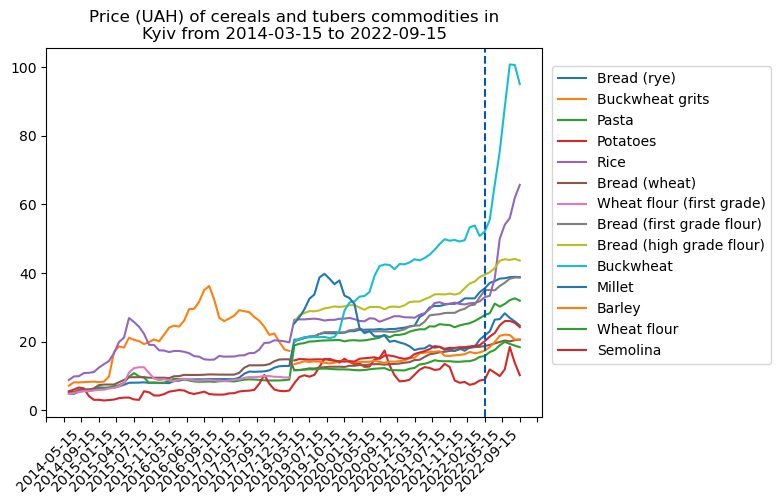

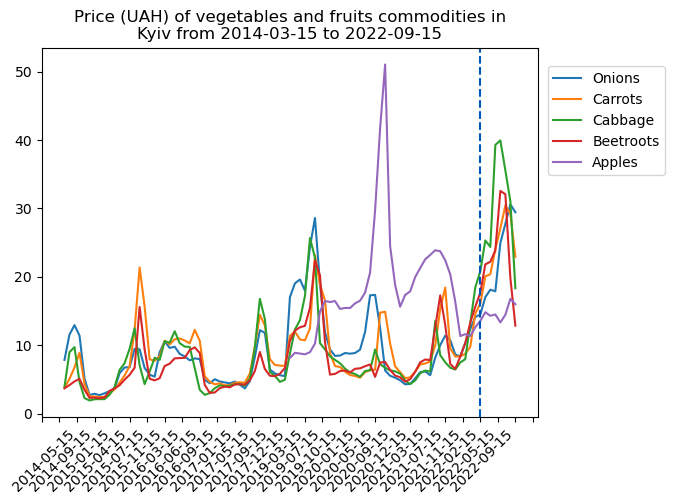

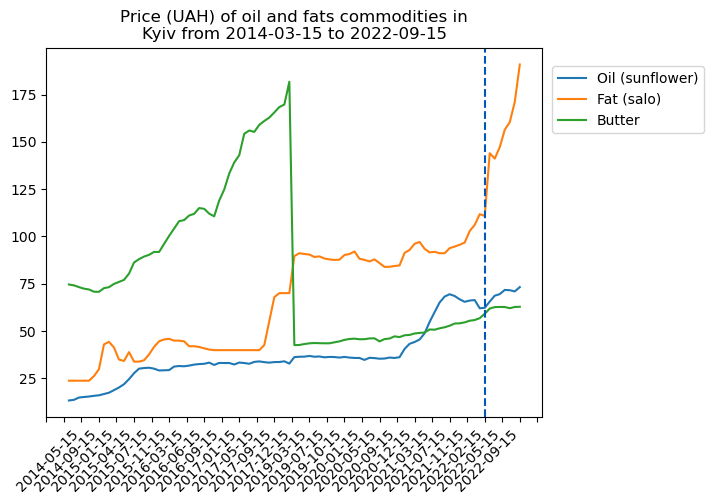

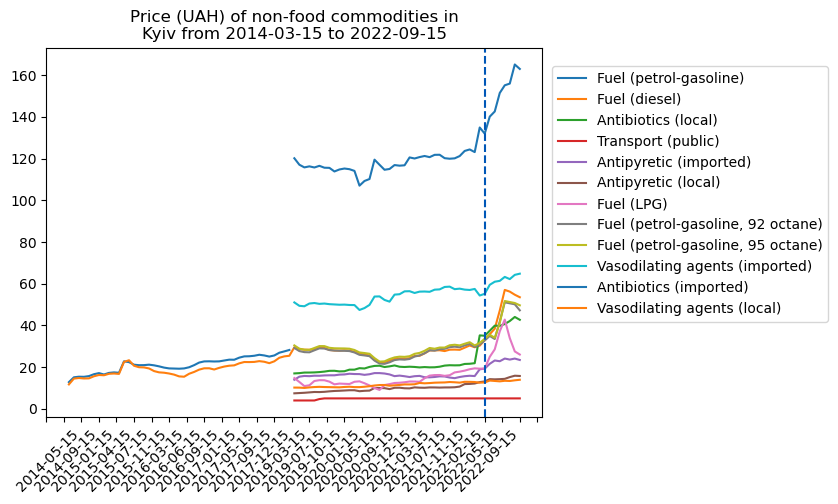

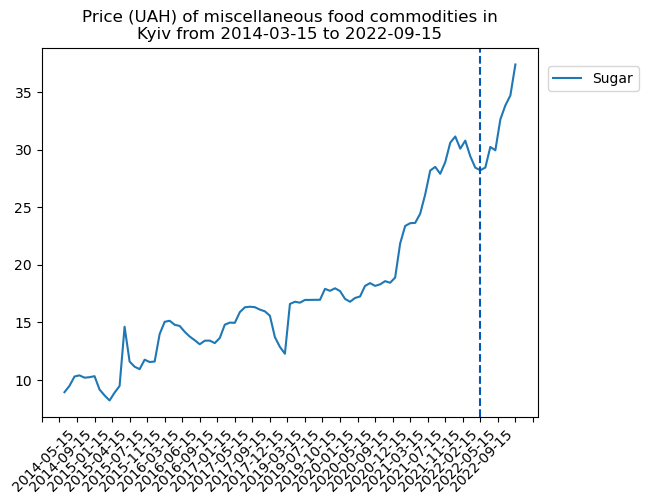

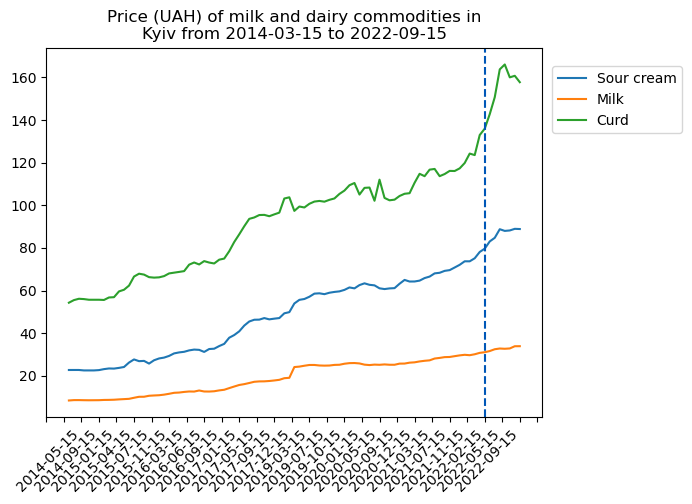

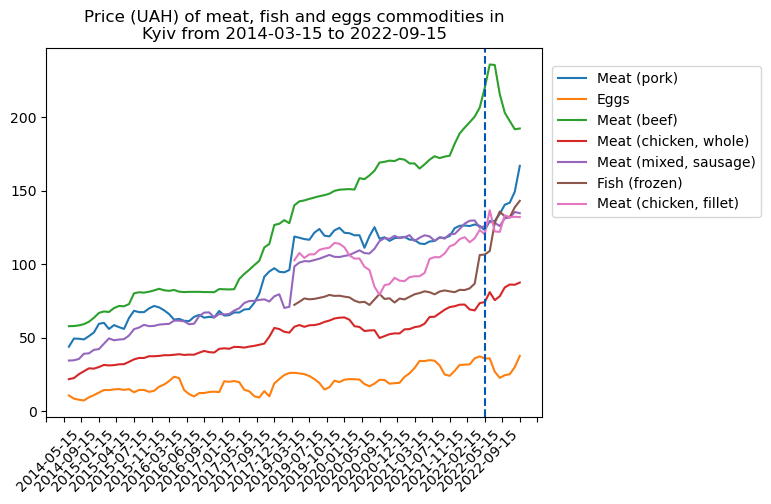

In [6]:
df_capital_data = df_commodities[df_commodities["market"] == 'Kyiv']
location = "Kyiv"

plot_prices_over_time(df_capital_data, location)

Código a seguir referente à média nacional de regiões ucranianas

In [7]:
df_markets = df_commodities[df_commodities['market'] != 'National Average'] 
df_avg_prices = df_markets.groupby(['date', 'category', 'commodity']).mean('price').reset_index()

display(df_avg_prices)

,date,category,commodity,price,usdprice,year
0,2014-03-15,cereals and tubers,Bread (rye),4.907407,0.469341,2014.0
1,2014-03-15,cereals and tubers,Bread (wheat),4.840385,0.463004,2014.0
2,2014-03-15,cereals and tubers,Buckwheat grits,7.429259,0.710659,2014.0
3,2014-03-15,cereals and tubers,Pasta,5.385926,0.515170,2014.0
4,2014-03-15,cereals and tubers,Potatoes,6.637037,0.634807,2014.0
...,...,...,...,...,...,...
3132,2023-01-15,vegetables and fruits,Apples,15.615000,0.426994,2023.0
3133,2023-01-15,vegetables and fruits,Beetroots,12.033333,0.329056,2023.0
3134,2023-01-15,vegetables and fruits,Cabbage,12.829444,0.350828,2023.0
3135,2023-01-15,vegetables and fruits,Carrots,24.417778,0.667733,2023.0


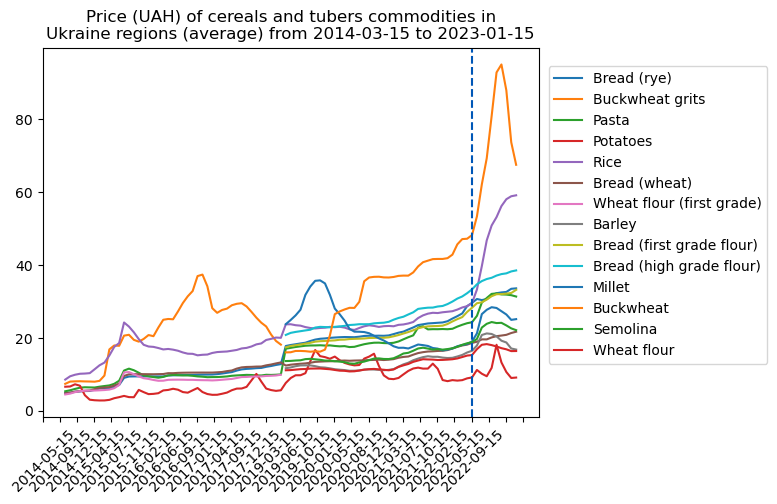

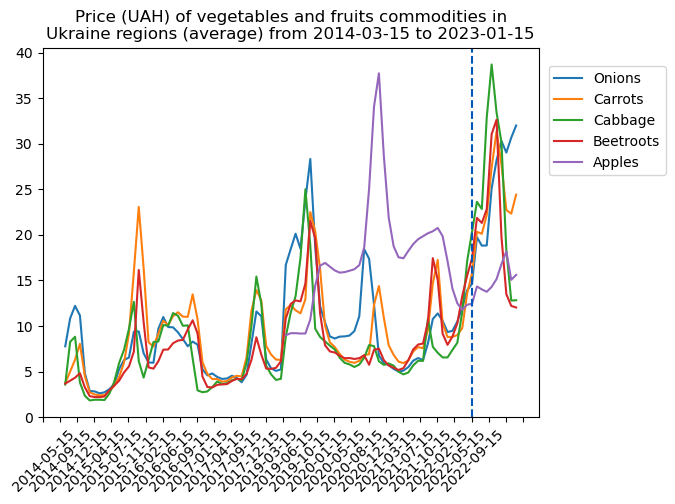

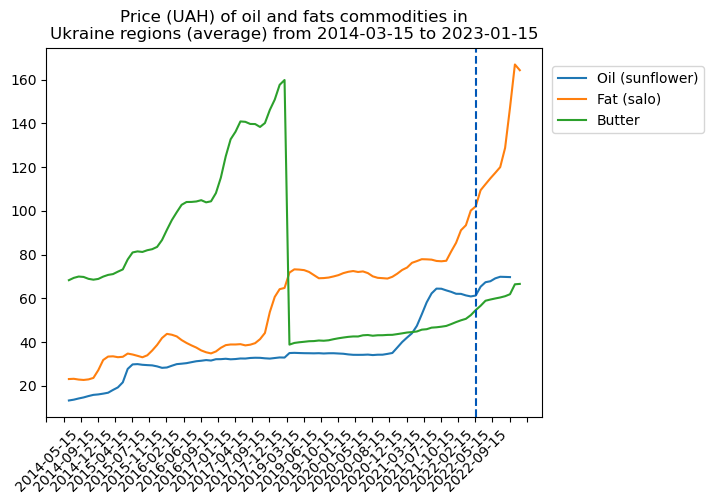

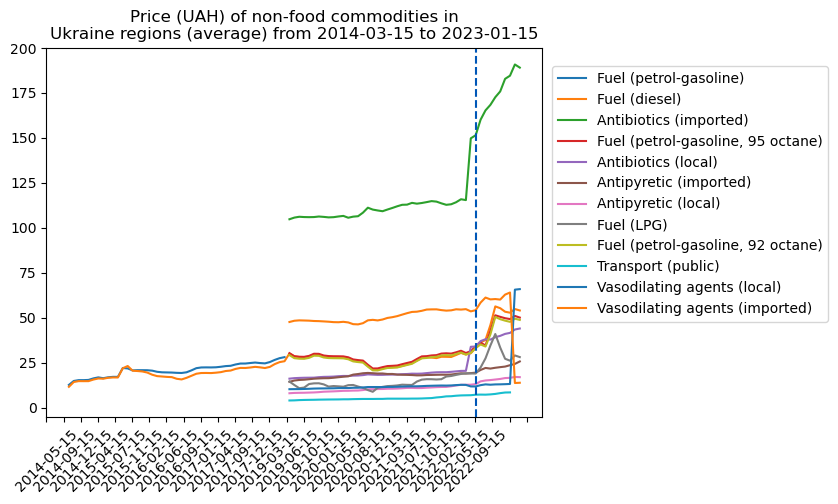

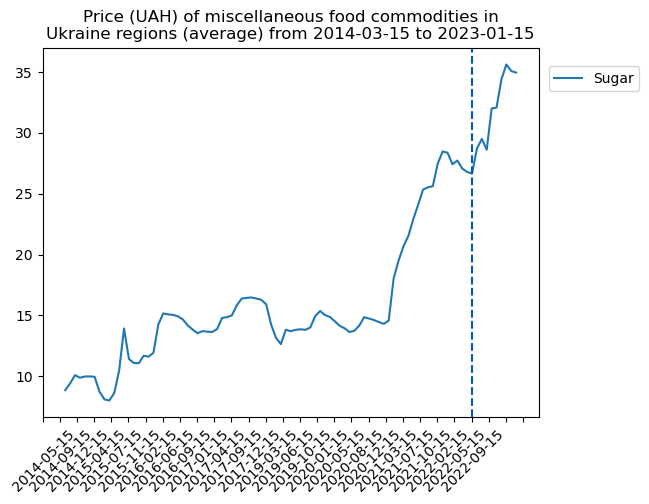

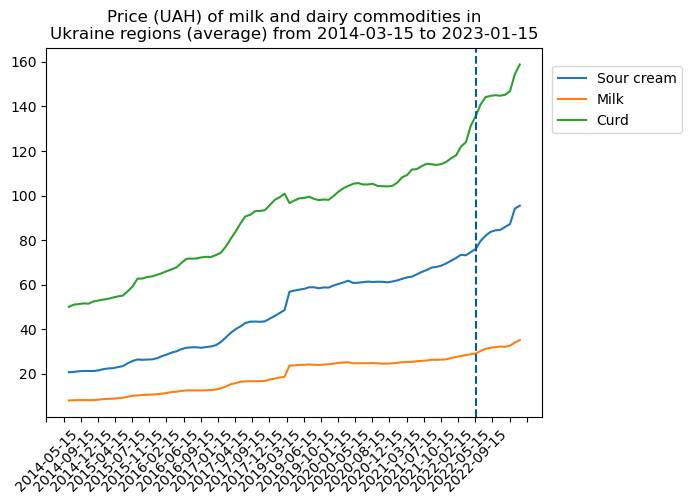

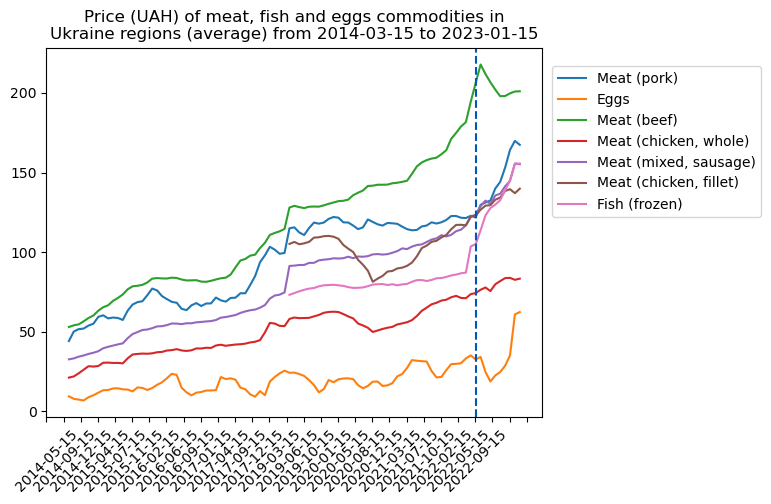

In [8]:
location = "Ukraine regions (average)"

plot_prices_over_time(df_avg_prices, location)

Código a seguir referente à análise geoespacial da mudança do preço do __arroz__ antes e a partir de 2022 (início da guerra) na Ucrânia

In [9]:
df_rice_prices = df_commodities[df_commodities['commodity'] == 'Rice']

df_rice_prices_year = df_rice_prices.copy()

df_rice_prices_year['year'] = df_rice_prices['date'].str[0:4]

df_rice_prices_year['year'] = df_rice_prices_year.loc[:, ('year')].apply(pd.to_numeric)

display(df_rice_prices_year)

,date,admin1,admin2,market,latitude,longitude,category,commodity,unit,priceflag,pricetype,currency,price,usdprice,year
6,2014-03-15,NaN,NaN,National Average,NaN,NaN,cereals and tubers,Rice,KG,actual,Retail,UAH,8.66,0.8280,2014
31,2014-03-15,Avtonomna Respublika Krym,Simferopolska,Crimea,44.952117,34.102417,cereals and tubers,Rice,KG,actual,Retail,UAH,7.76,0.7422,2014
56,2014-03-15,Cherkaska,Cherkaska,Cherkasy,49.444433,32.0597669999999,cereals and tubers,Rice,KG,actual,Retail,UAH,9.41,0.8997,2014
80,2014-03-15,Chernihivska,Chernihivska,Chernihiv,51.4981999999999,31.28935,cereals and tubers,Rice,KG,actual,Retail,UAH,8.54,0.8172,2014
105,2014-03-15,Chernivetska,Chernivetska,Chernivtsi,48.2920787,25.9358366999999,cereals and tubers,Rice,KG,actual,Retail,UAH,9.28,0.8876,2014
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
77325,2023-01-15,Vinnytska,Vinnytska,Vinnytsya,49.233083,28.4682169999999,cereals and tubers,Rice,KG,actual,Retail,UAH,58.20,1.5915,2023
77365,2023-01-15,Volynska,Lutska,Volyn,50.7472329999999,25.3253829999999,cereals and tubers,Rice,KG,actual,Retail,UAH,59.26,1.6205,2023
77405,2023-01-15,Zakarpatska,Uzhhorodska,Zakarpattya,48.6208,22.2878829999999,cereals and tubers,Rice,KG,actual,Retail,UAH,59.75,1.6339,2023
77445,2023-01-15,Zaporizka,Zaporizka,Zaporizhzhya,47.8388,35.1395669999999,cereals and tubers,Rice,KG,actual,Retail,UAH,62.31,1.7039,2023


In [10]:
df_rice_pre2022 = df_rice_prices_year[df_rice_prices_year['year'] < 2022]
df_rice_post2022 = df_rice_prices_year[df_rice_prices_year['year'] >= 2022]

In [12]:
max_price_rice_pre2022 = df_rice_pre2022.groupby(['market'])[['price']].mean().reset_index()

display(max_price_rice_pre2022)

,market,price
0,Cherkasy,19.638659
1,Chernihiv,18.523659
2,Chernivtsi,20.388659
3,Crimea,7.760000
4,Dnipropetrovsk,19.053780
5,Donetsk,22.472152
6,Iv.-Frankivsk,19.812195
7,Kharkiv,19.210122
8,Kherson,19.905610
9,Khmelnytskiy,18.663143


In [13]:
max_price_rice_post2022 = df_rice_post2022.groupby(['market'])[['price']].mean().reset_index()

display(max_price_rice_post2022)

,market,price
0,Cherkasy,45.617273
1,Chernihiv,47.553333
2,Chernivtsi,45.542727
3,Dnipropetrovsk,47.296364
4,Donetsk,33.440000
5,Iv.-Frankivsk,44.021111
6,Kharkiv,50.642857
7,Kherson,47.165455
8,Khmelnytskiy,46.446000
9,Kyiv,47.114444


In [14]:
geo_regions = gpd.read_file("../Dados/ukraine_regions.geojson")

display(geo_regions.head())

,region_en,region_ua,geometry
0,Cherkasy Oblast,Черкаська область,"POLYGON ((32.15047 50.19769, 32.15050 50.19181..."
1,Chernihiv Oblast,Чернігівська область,"POLYGON ((33.19667 52.37500, 33.20612 52.36700..."
2,Chernivtsi Oblast,Чернівецька область,"POLYGON ((25.62595 48.67673, 25.64460 48.67159..."
3,Autonomous Republic of Crimea,Автономна Республіка Крим,"MULTIPOLYGON (((33.79458 44.39153, 33.79291 44..."
4,Dnipropetrovsk Oblast,Дніпропетровська область,"POLYGON ((34.92995 49.15574, 34.92076 49.14992..."


In [15]:
geo_reg = geo_regions[['region_en', 'geometry']]

geo_reg["market"] = geo_reg["region_en"].map(lambda x: x.replace(" Oblast", ""))

display(geo_reg.head())

,region_en,geometry,market
0,Cherkasy Oblast,"POLYGON ((32.15047 50.19769, 32.15050 50.19181...",Cherkasy
1,Chernihiv Oblast,"POLYGON ((33.19667 52.37500, 33.20612 52.36700...",Chernihiv
2,Chernivtsi Oblast,"POLYGON ((25.62595 48.67673, 25.64460 48.67159...",Chernivtsi
3,Autonomous Republic of Crimea,"MULTIPOLYGON (((33.79458 44.39153, 33.79291 44...",Autonomous Republic of Crimea
4,Dnipropetrovsk Oblast,"POLYGON ((34.92995 49.15574, 34.92076 49.14992...",Dnipropetrovsk


In [17]:
rice_prices_list = max_price_rice_pre2022.price.tolist() + max_price_rice_post2022.price.tolist()

min_price = min(rice_prices_list)
max_price = max(rice_prices_list)

bins = np.linspace(min_price, max_price, 10)
coordinates = [49.5, 31]

zoom_start = 6

In [18]:
map_rice_pre2022 = folium.Map(location = coordinates, tiles = 'cartodbpositron', zoom_start = zstart)

rice_pre2022_data = geo_reg.merge(max_price_rice_pre2022, on = 'market')

Choropleth(
    geo_data = rice_pre2022_data,
    data = rice_pre2022_data,
    columns = ['region_en', 'price'],
    key_on = "feature.properties.region_en", 
    fill_color = 'Spectral',
    bins = bins,
    legend_name = "Preço máximo do arroz em regiões da Ucrânia antes de 2022"
).add_to(map_rice_pre2022)

map_rice_pre2022

In [19]:
map_rice_post2022 = folium.Map(location = coordinates, tiles = 'cartodbpositron', zoom_start = zstart)

rice_post2022_data = geo_reg.merge(max_price_rice_post2022, on = 'market')

Choropleth(
    geo_data = rice_post2022_data,
    data = rice_post2022_data,
    columns = ['region_en', 'price'],
    key_on = "feature.properties.region_en", 
    fill_color = 'Spectral',
    bins = bins,
    legend_name = "Preço máximo do arroz em regiões da Ucrânia a partir de 2022"
).add_to(map_rice_post2022)

map_rice_post2022

In [20]:
rice_max_diff = max_price_rice_post2022.merge(max_price_rice_pre2022, how = 'inner', on = 'market')

display(rice_max_diff)

,market,price_x,price_y
0,Cherkasy,45.617273,19.638659
1,Chernihiv,47.553333,18.523659
2,Chernivtsi,45.542727,20.388659
3,Dnipropetrovsk,47.296364,19.053780
4,Donetsk,33.440000,22.472152
5,Iv.-Frankivsk,44.021111,19.812195
6,Kharkiv,50.642857,19.210122
7,Kherson,47.165455,19.905610
8,Khmelnytskiy,46.446000,18.663143
9,Kyiv,47.114444,21.827439


In [21]:
rice_max_diff['price_diff'] = rice_max_diff['price_x'] - rice_max_diff['price_y']

display(rice_max_diff)

,market,price_x,price_y,price_diff
0,Cherkasy,45.617273,19.638659,25.978614
1,Chernihiv,47.553333,18.523659,29.029675
2,Chernivtsi,45.542727,20.388659,25.154069
3,Dnipropetrovsk,47.296364,19.053780,28.242583
4,Donetsk,33.440000,22.472152,10.967848
5,Iv.-Frankivsk,44.021111,19.812195,24.208916
6,Kharkiv,50.642857,19.210122,31.432735
7,Kherson,47.165455,19.905610,27.259845
8,Khmelnytskiy,46.446000,18.663143,27.782857
9,Kyiv,47.114444,21.827439,25.287005


In [22]:
map_rice_diff = folium.Map(location = coordinates, tiles = 'cartodbpositron', zoom_start = zstart)

rice_diff_data = geo_reg.merge(rice_max_diff, on = 'market')

Choropleth(
    geo_data = rice_diff_data,
    data = rice_diff_data,
    columns = ['region_en', 'price_diff'],
    key_on = "feature.properties.region_en", 
    fill_color = 'Spectral',
    bins = [x for x in range(-4, 41, 3)],
    legend_name = "Diferença de preços do arroz entre depois e antes de 2022"
).add_to(map_rice_diff)

map_rice_diff